<a href="https://colab.research.google.com/github/R-V-7/Neural-Style-Transfer/blob/main/Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install tensorflow-addons # For adding Instance Normalization.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 5.8 MB/s eta 0:00:00


In [2]:
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import os
import time
from IPython.display import clear_output

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [3]:
tf.__version__

'2.15.0'

In [4]:
import tensorflow_datasets as tfds #For importing the dataset required for training.

In [5]:
tf.random.set_seed(7)

In [7]:
from google.colab import drive #Connect Google Drive to workspace
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
dataset, metadata = tfds.load("cycle_gan/cezanne2photo", with_info = True, as_supervised = True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/4 [00:00<?, ? splits/s]

Generating trainA examples...:   0%|          | 0/525 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/cezanne2photo/incomplete.0W7Q9W_3.0.0/cycle_gan-trainA.tfrecord*…

Generating trainB examples...:   0%|          | 0/6287 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/cezanne2photo/incomplete.0W7Q9W_3.0.0/cycle_gan-trainB.tfrecord*…

Generating testA examples...:   0%|          | 0/58 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/cezanne2photo/incomplete.0W7Q9W_3.0.0/cycle_gan-testA.tfrecord*.…

Generating testB examples...:   0%|          | 0/751 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/cezanne2photo/incomplete.0W7Q9W_3.0.0/cycle_gan-testB.tfrecord*.…

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/cezanne2photo/3.0.0. Subsequent calls will reuse this data.


In [9]:
dataset

{'trainA': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 'trainB': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 'testA': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>,
 'testB': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>}

In [10]:
train_A=dataset["trainA"]
train_B=dataset["trainB"]
train_B = train_B.skip(1000).take(1000).prefetch(tf.data.AUTOTUNE) #Train_B has around 6000 examples, which would require a lot of time to train at once.So, I trained 1000 at a time.
test_A=dataset["testA"]
test_B=dataset["testB"]

In [11]:
train_A

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [12]:
len(train_A),len(train_B),len(test_A),len(test_B)

(525, 1000, 58, 751)

In [13]:
batch_size=1 # As defined in the original paper to reduce memory usage.

In [14]:
def process_training_img(img,label):
  img=tf.image.resize(img,size=[286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR) #Upscaled as image will then be cropped.
  img= tf.image.random_crop(img, size=[256,256,3]) # Images need to be in this size for input into the generator and is defined in the original paper.
  img = tf.image.random_flip_left_right(img) #Defined in the original paper to randomly select images for mirroring, in order to avoid overfitting.
  img = tf.cast(img, tf.float32)
  img = (img / 127.5) - 1 #Normalize to [-1,1]
  return img


In [16]:
def process_testing_img(img,label):
  img=tf.cast(img,tf.float32)
  img = (img / 127.5) - 1
  return img


In [17]:
# Create Batches as images need to be in batch format for input into the generator and the discriminator.Shuffling the training dataset to ensure similar training examples do not end up together and model does not generalize on those examples.

train_A = train_A.cache().map(process_training_img, num_parallel_calls=tf.data.AUTOTUNE).shuffle(len(train_A)).batch(batch_size)
train_B = train_B.cache().map(process_training_img, num_parallel_calls=tf.data.AUTOTUNE).shuffle(len(train_B)).batch(batch_size)
test_A = test_A.cache().map(process_testing_img, num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size)
test_B = test_B.cache().map(process_testing_img, num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size)

In [18]:
train_A

<_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>

In [19]:
sample_A=next(iter(train_A))

In [20]:
sample_A.shape

TensorShape([1, 256, 256, 3])

In [21]:
sample_B=next(iter(train_B))

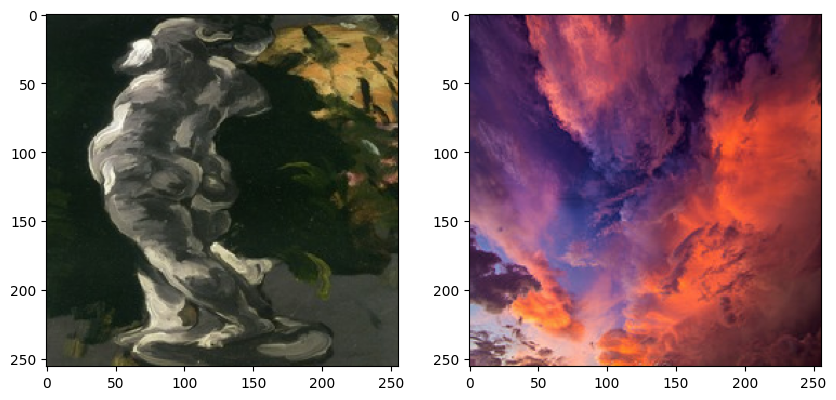

In [22]:
# Viewing the training datasets
plt.figure(figsize=(10,10))
img_list=[sample_A[0],sample_B[0]]
for i in range(2):
  plt.subplot(1,2,i+1)
  plt.imshow(img_list[i]*0.5+0.5)
plt.show()


In [23]:
#Downsampling
def encode(filters,size,apply_instancenorm=True):
  initial_filter=tf.random_normal_initializer(0,0.02)
  model=tf.keras.Sequential()
  model.add(tf.keras.layers.Conv2D(filters,size,padding="same",strides=2,kernel_initializer=initial_filter,use_bias=False))
  if apply_instancenorm:
    model.add(tfa.layers.InstanceNormalization())
  model.add(tf.keras.layers.LeakyReLU())
  return model


In [24]:
#Upsampling
def decode(filters,size,apply_dropout=False):
  initial_filter=tf.random_normal_initializer(0,0.02)
  model=tf.keras.Sequential()
  model.add(tf.keras.layers.Conv2DTranspose(filters,size,padding="same",strides=2,kernel_initializer=initial_filter,use_bias=False))
  model.add(tfa.layers.InstanceNormalization())
  if apply_dropout:
    model.add(tf.keras.layers.Dropout(0.5))
  model.add(tf.keras.layers.LeakyReLU())
  return model

In [25]:
def generator_downsample(inputs,downsampling):
  x=inputs
  stores=[]
  for downsample in downsampling:
    x=downsample(x)
    stores.append(x)
  stores=stores[:-1]
  stores=reversed(stores)
  return x,stores


In [26]:
def generator_upsample(inputs,upsampling,stores):
  x=inputs
  for upsample,store in zip(upsampling,stores):
    x=upsample(x)
    x=tf.keras.layers.Concatenate()([x,store])
  return x



In [27]:
def Generator():
  inputs=tf.keras.layers.Input(shape=[256,256,3])

  downsampling=[
      encode(64,4,apply_instancenorm=False), #(batch_size,128,128,64)
      encode(128,4),                      #(batch_size,64,64,128)
      encode(256,4),                      #(batch_size,32,32,256)
      encode(512,4),                      #(batch_size,16,16,512)
      encode(512,4),                      #(batch_size,8,8,512)
      encode(512,4),                      #(batch_size,4,4,512)
      encode(512,4),                      #(batch_size,2,2,512)
      encode(512,4)                       #(batch_size,1,1,512)
  ]
  upsampling=[
      decode(512,4,apply_dropout=True),    #(batch_size,2,2,512)
      decode(512,4,apply_dropout=True),    #(batch_size,4,4,512)
      decode(512,4,apply_dropout=True),    #(batch_size,8,8,512)
      decode(512,4),                       #(batch_size,16,16,512)
      decode(256,4),                       #(batch_size,32,32,256)
      decode(128,4),                       #(batch_size,64,64,128)
      decode(64,4)                         #(batch_size,128,128,64)
  ]

  initial_filter=tf.random_normal_initializer(0,0.02)
  last_layer=tf.keras.layers.Conv2DTranspose(filters=3,kernel_size=4,padding="same",strides=2,kernel_initializer=initial_filter,activation="tanh")

  x,stores=generator_downsample(inputs,downsampling)

  x=generator_upsample(x,upsampling,stores)

  x=last_layer(x)

  return tf.keras.Model(inputs = inputs, outputs = x)


In [28]:
generator_g=Generator()
generator_f=Generator()
generator_f1=Generator()
generator_f2=Generator()


In [29]:
def Discriminator():
  initial_filter=tf.random_normal_initializer(0,0.02)
  x=tf.keras.layers.Input(shape=[256,256,3])
  downsample1=encode(64,4,False)(x) #(batch_size,128,128,64)
  downsample2=encode(128,4)(downsample1) #(batch_size,64,64,128)
  downsample3=encode(256,4)(downsample2) #(batch_size,32,32,256)

  zero_padding1=tf.keras.layers.ZeroPadding2D()(downsample3) #(batch_size,34,34,256)
  downsample4=tf.keras.layers.Conv2D(filters=512,kernel_size=4,strides=1,kernel_initializer=initial_filter,use_bias=False)(zero_padding1) #(batch_size,31,31,512)
  instancenorm1=tfa.layers.InstanceNormalization()(downsample4)
  leaky_relu=tf.keras.layers.LeakyReLU()(instancenorm1)
  zero_padding2=tf.keras.layers.ZeroPadding2D()(leaky_relu) #(batch_size,33,33,512)
  last=tf.keras.layers.Conv2D(1,4,strides=1,kernel_initializer=initial_filter)(zero_padding2) #(batch_size,30,30,512)

  return tf.keras.Model(inputs=x,outputs=last)

In [30]:
discriminator_x=Discriminator()
discriminator_y=Discriminator()

In [31]:
lambda_value=10

In [32]:
loss = tf.keras.losses.BinaryCrossentropy(from_logits = True) #Loss Function.

In [33]:
def discriminator_loss(real, generated):
  real_img_loss = loss(tf.ones_like(real), real) #Real image is compared with tensors filled with ones.
  generated_img_loss = loss(tf.zeros_like(generated), generated) #Fake image is compared with tensors filled with zeros.
  return real_img_loss+generated_img_loss

In [34]:
def generator_loss(generated):
  return loss(tf.ones_like(generated), generated) # generated(fake) is compared with ones in order to check how much real the generated image is and thus penalize if generated image looks fake.

In [35]:
def cycle_loss(real_img, cycled_img):
  return (lambda_value)* tf.reduce_mean(tf.abs(real_img - cycled_img)) #Loss calculated between X and X' where X is the training input and X' is (X->Y->X')

In [36]:
def identity_loss(real_img, actually_img):
  return (lambda_value) * 0.5 * tf.reduce_mean(tf.abs(real_img - actually_img)) #Loss is calculated when instead of input X/Y in generator f/g we input Y/X

In [37]:
learning_rate = 0.0002 #Predefined
beta1, beta2 = 0.5, 0.999

In [38]:
#optimizers
optimizer_generator_g = tf.keras.optimizers.Adam(learning_rate, beta_1 = beta1, beta_2 = beta2)
optimizer_generator_f = tf.keras.optimizers.Adam(learning_rate, beta_1 = beta1, beta_2 = beta2)
optimizer_discriminator_x = tf.keras.optimizers.Adam(learning_rate, beta_1 = beta1, beta_2 = beta2)
optimizer_discriminator_y = tf.keras.optimizers.Adam(learning_rate, beta_1 = beta1, beta_2 = beta2)

In [39]:
@tf.function
def training_steps(real_x,real_y):
  with tf.GradientTape(persistent=True) as tape:
    fake_y=generator_g(real_x,training=True) # Fake image
    fake_x=generator_f(real_y,training=True) # Fake paint
    cycled_x=generator_f(fake_y,training=True) # Paint from fake image
    cycled_y=generator_g(fake_x,training=True) # Image from fake paint
    actually_x=generator_f(real_x,training=True) # Fake paint from real paint
    actually_y=generator_g(real_y,training=True) # Fake image from real image

    discriminator_real_x=discriminator_x(real_x,training=True) #Real paint
    discriminator_fake_x=discriminator_x(fake_x,training=True) #Generated paint
    discriminator_real_y=discriminator_y(real_y,training=True) #Real image
    discriminator_fake_y=discriminator_y(fake_y,training=True) #Generated image

    generator_g_loss = generator_loss(discriminator_fake_y)
    generator_f_loss = generator_loss(discriminator_fake_x)
    cycle_loss_total = cycle_loss(real_x, cycled_x) + cycle_loss(real_y, cycled_y)
    total_generator_g_loss = generator_g_loss + cycle_loss_total + identity_loss(real_y, actually_y)
    total_generator_f_loss = generator_f_loss + cycle_loss_total + identity_loss(real_x, actually_x)
    discriminator_x_loss = discriminator_loss(discriminator_real_x, discriminator_fake_x)
    discriminator_y_loss = discriminator_loss(discriminator_real_y, discriminator_fake_y)

  generator_g_gradients = tape.gradient(total_generator_g_loss, generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_generator_f_loss, generator_f.trainable_variables)
  discriminator_x_gradients = tape.gradient(discriminator_x_loss, discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(discriminator_y_loss, discriminator_y.trainable_variables)


  optimizer_generator_g.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
  optimizer_generator_f.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
  optimizer_discriminator_x.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
  optimizer_discriminator_y.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))









In [59]:
def generate_output(generator_f1,generator_f2,generator_f3,test_input):
  generated1 = generator_f1(test_input)
  generated2=generator_f2(test_input)
  generated3=generator_f3(test_input)
  plt.figure(figsize = (20,20))
  plt.subplot(1,4,1)
  plt.imshow(test_input[0]*0.5+0.5)
  plt.title("Original")
  plt.axis("off")
  plt.subplot(1,4,2)
  plt.imshow(generated1[0]*0.5+0.5)
  plt.title("Generated Vangogh")
  plt.axis("off")
  plt.subplot(1,4,3)
  plt.imshow(generated2[0]*0.5+0.5)
  plt.title("Generated Ukiyoe")
  plt.axis("off")
  plt.subplot(1,4,4)
  plt.imshow(generated3[0]*0.5+0.5)
  plt.title("Generated Cezanne")
  plt.axis("off")

  plt.show()



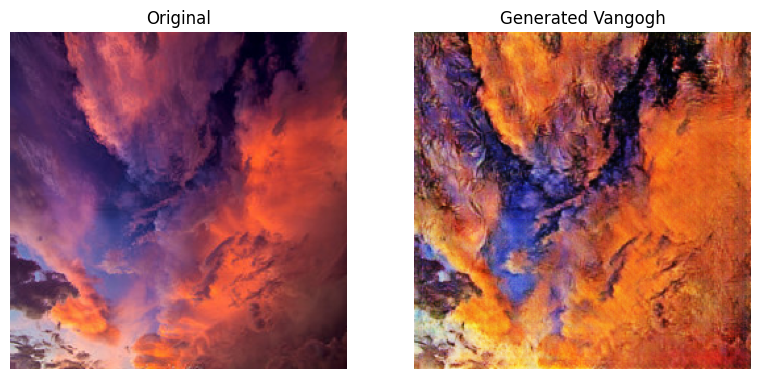

In [51]:
generate_output(generator_f,sample_B)

In [52]:
checkpoint_dir = "/content/drive/MyDrive/cezannecheckpoints"
checkpoint = tf.train.Checkpoint(generator_g = generator_g,
                                 generator_f = generator_f,
                                 discriminator_x = discriminator_x,
                                 discriminator_y = discriminator_y,
                                 generator_g_optimizer=optimizer_generator_g,
                                 generator_f_optimizer = optimizer_generator_f,
                                 discriminator_x_optimizer = optimizer_discriminator_x,
                                 discriminator_y_optimizer = optimizer_discriminator_y)
checkpoint_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep = 5)
if checkpoint_manager.latest_checkpoint:
  checkpoint.restore(checkpoint_manager.latest_checkpoint)
  print('Latest checkpoint restored!')

Latest checkpoint restored!


In [57]:
def train(train_A, train_B, generator_f, steps):
  i=1000
  for epoch in epochs:
    if(epoch+1)%10==0:
      train_B=dataset["trainB"]
      train_B=train_B.skip(i).take(1000).prefetch(tf.data.AUTOTUNE)
      train_B = train_B.cache().map(process_training_img, num_parallel_calls=tf.data.AUTOTUNE).shuffle(len(train_B)).batch(batch_size)
      i=i+1000

    for img_x, img_y in tf.data.Dataset.zip((train_A, train_B)):
      training_steps(img_x, img_y)

    if (epoch + 1) % 5 == 0:
      checkpoint_dir_saved = checkpoint_manager.save()

    model_path = f'/content/drive/MyDrive/cezanne models/model_cyclegan_epoch_{epoch + 1:02d}.h5'
    generator_f.save_weights(model_path)
  print("Training Completed!")


In [55]:
train(train_A=train_A,train_B=train_B,generator_f=generator_f,steps=epochs)

Training Completed!


In [56]:
epochs = list(range(60,70))



In [58]:
generator_f.load_weights("/content/drive/MyDrive/vangogh2 models/model_cyclegan_epoch_70.h5")
generator_f1.load_weights("/content/drive/MyDrive/ukiyoe models/model_cyclegan_epoch_70.h5")
generator_f2.load_weights("/content/drive/MyDrive/cezanne models/model_cyclegan_epoch_70.h5")

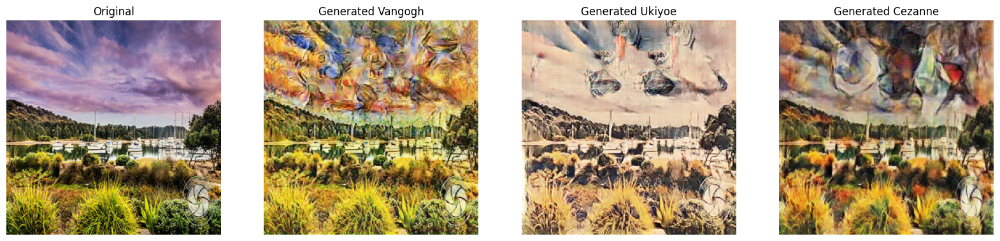

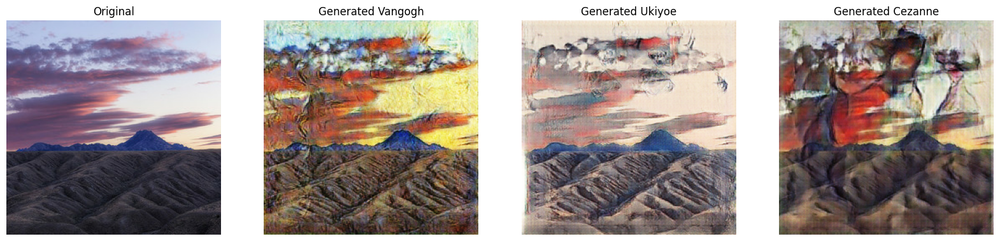

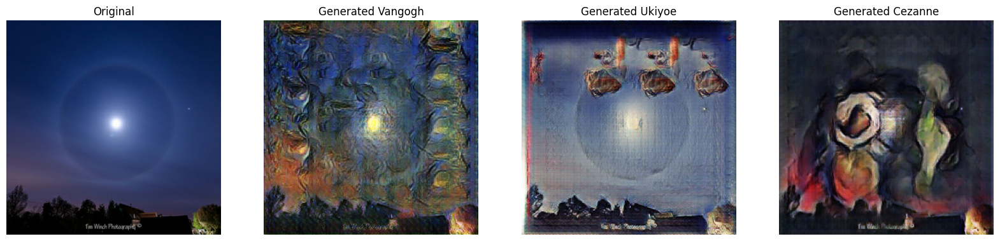

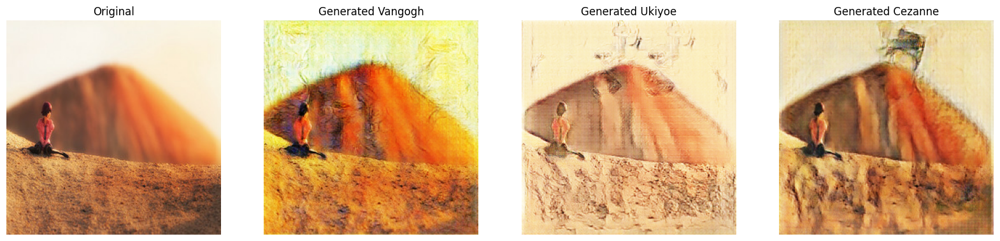

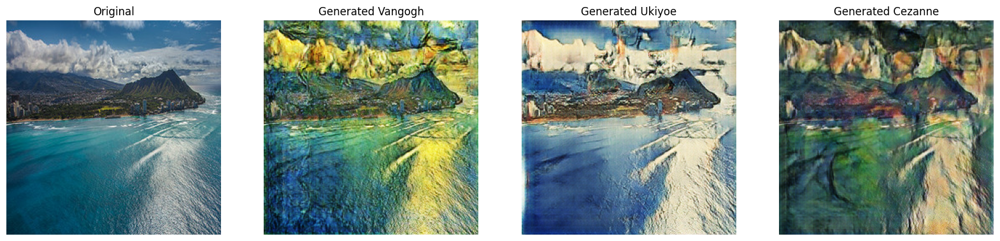

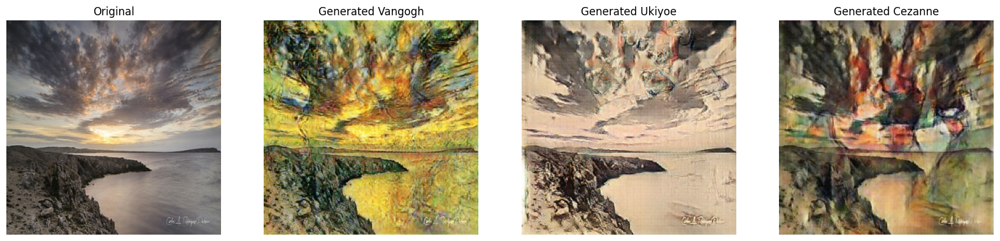

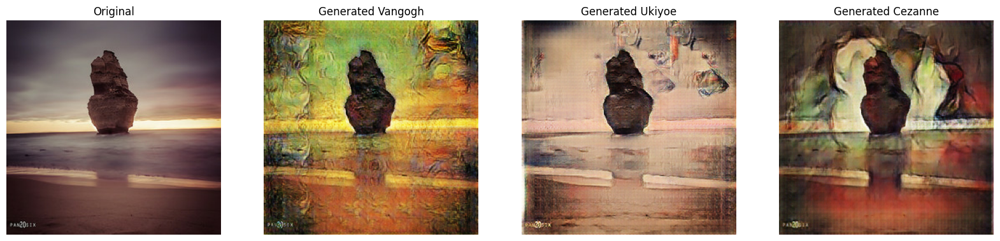

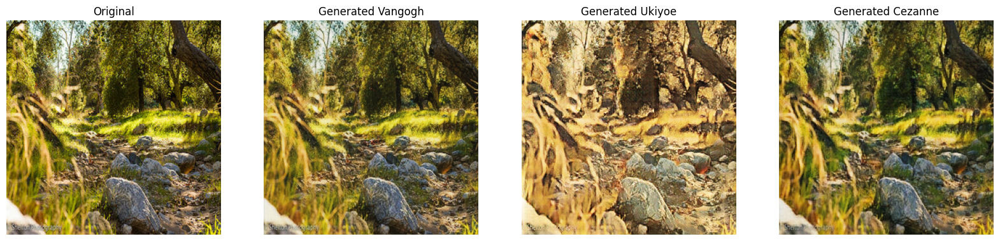

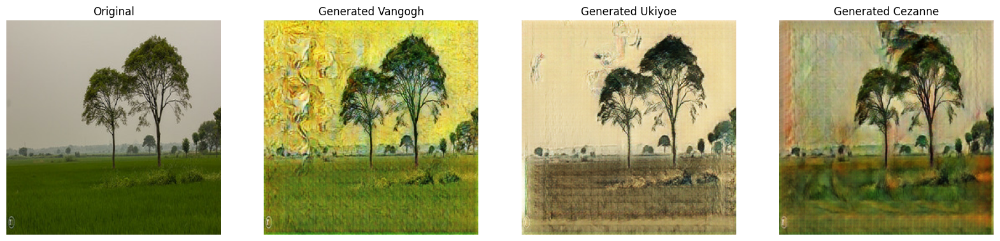

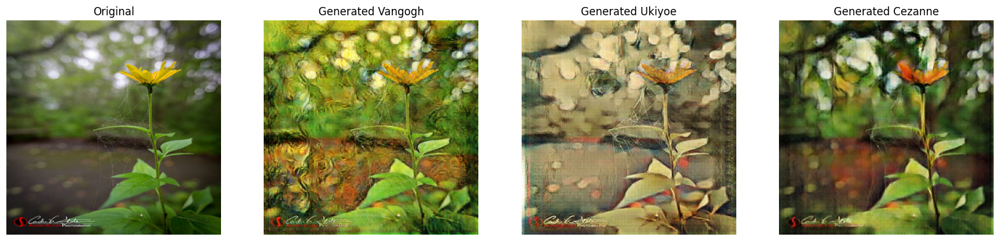

In [62]:
for input in test_B.skip(500).take(10):
  generate_output(generator_f,generator_f1,generator_f2, input)
